In [1]:
using Revise
using LilGuys
using CairoMakie, Arya
LP = LilGuys.Plots

LilGuys.Plots

In [2]:
using Printf

In [3]:
import DataFrames: DataFrame, rename!

In [4]:
models_dir = "/astro/dboyea/sculptor/"

"/astro/dboyea/sculptor/"

In [5]:
load_profile(name) = LilGuys.Profiles3D(joinpath(models_dir, "$name/out/profiles.hdf5"))

load_profile (generic function with 1 method)

In [6]:
t_max_host = 316 # computed with agama at peri=50.95 
M_max_host = 52.437
r_peri = 50.95
ρ_peri = M_max_host / (4π/3 * r_peri^3)

9.46491379338667e-5

In [51]:
halo = LilGuys.load_profile("/astro/dboyea/sculptor/isolation/1e6_zeno2/halo.toml")
halo = LilGuys.TruncNFW(r_s=halo.r_s, M_s=halo.M_s, trunc=100)

LilGuys.TruncNFW(0.29, 2.76, 276.0, 13.086635052895323)

In [47]:
function compare_densities(profiles, labels)
    fig = Figure()
    ax = LP.rho_axis(fig[1, 1])
    ax.limits=(-2, 3, -12, 0)

    log_r = LinRange(-2, 3, 1000)
    ρ = calc_ρ.(halo, 10 .^ log_r)
    lines!(log_r, log10.(ρ), color=:black, linestyle=:dash)
    
    for i in eachindex(profiles)
        profile = profiles[i][1]
        lines!(profile.log_r, log10.(profile.rho),
            linestyle=:dot,
            color=COLORS[i]
        )
    
        profile = profiles[i][end]
        lines!(profile.log_r, log10.(profile.rho), 
            color=COLORS[i],
            label=labels[i]
        )    
    end
    
    axislegend()
    fig

end

compare_densities (generic function with 1 method)

In [11]:
function load_cpu_use(model_dir::String)
    filename = joinpath(models_dir, model_dir, "out/cpu.csv")

    lines = readlines(filename)
    lines[1] = replace(lines[1], "MULTIPLEDOMAIN, " => "")

    data = [split(line, ", ")[1:end-1] for line in lines[2:end]]
    
    columns = split(lines[1], ", ")[1:end-1]
    columns = replace.(columns, "1"=>"", "2"=>"_TOT", "3"=>"_PERCEN")

    Ncol = length(columns)

    data = [[row[i] for row in data] for i in 1:Ncol]
    df = DataFrame(data, Symbol.(columns))

    convert_types!(df)

    return df
end

load_cpu_use (generic function with 1 method)

In [12]:
# Function to convert SubString values to Int, Float, or leave as String
function convert_types!(df::DataFrame)
    for col in names(df)
        df[!, col] = [tryparse(Int, val) !== nothing ? tryparse(Int, val) :
                      tryparse(Float64, val) !== nothing ? tryparse(Float64, val) :
                      val for val in df[!, col]]
    end
end

convert_types! (generic function with 1 method)

In [13]:
function get_tot_cpu(model_dir::String)
    df = load_cpu_use(model_dir)

    return df.CPU_ALL_TOT[end] * df.CPUS[end]
end

get_tot_cpu (generic function with 1 method)

In [14]:
function cpu_summary(model_dir::String)
    df = load_cpu_use(model_dir)

    tot = df.CPU_ALL_TOT[end] * df.CPUS[end]
    percen_tree = LilGuys.mean(df.CPU_TREE_PERCEN)

    if "CPU_PM_GRAVITY_PERCEN" ∈ names(df)
        percen_tree = percen_tree + LilGuys.mean(df.CPU_PM_GRAVITY_PERCEN)
    end

    return tot, percen_tree
end

cpu_summary (generic function with 1 method)

## Orbit Profiles

In [16]:
model_names = [
    "V32_r5",
    "V32_r2.4",
   # "V50",
    "V50_r0.5", 
   # "V60_r5.4", 
   # "V70_r0.4"
]

3-element Vector{String}:
 "V32_r5"
 "V32_r2.4"
 "V50_r0.5"

In [17]:
profiles = load_profile.(["orbits/orbit1/1e6/"] .*  model_names);

In [18]:
labels = Dict(
    "V32_r5" => "V=32, r=5.6", 
    "V32_r2.4" => "V=32, r=2.4",
    "V50" => "V=50, r=10.8",
    "V50_r0.5" => "V=50, r=5.4", 
    "V60_r5.4" => "V=60, r=5.4", 
    "V70_r0.4" => "V=70, r=6.5"
    )

labels = [labels[name] for name in model_names]

3-element Vector{String}:
 "V=32, r=5.6"
 "V=32, r=2.4"
 "V=50, r=5.4"

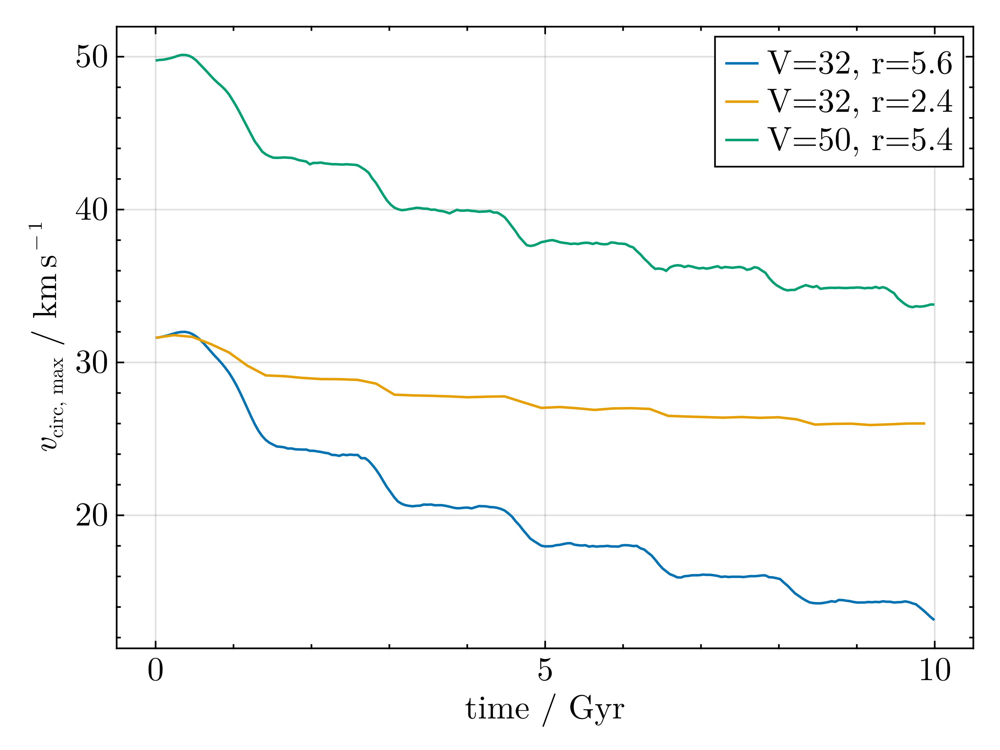

In [19]:
let
	fig, ax = FigAxis(
		xlabel="time / Gyr",
		ylabel = L"$v_\textrm{circ, max}$ / km\,s$^{-1}$"
	)


	for i in eachindex(profiles)
		
		vs = [p.v_circ_max for p in profiles[i].profiles]
		lines!(profiles[i].times * T2GYR, (vs * V2KMS), label=labels[i])
	end

	axislegend()
	fig
end

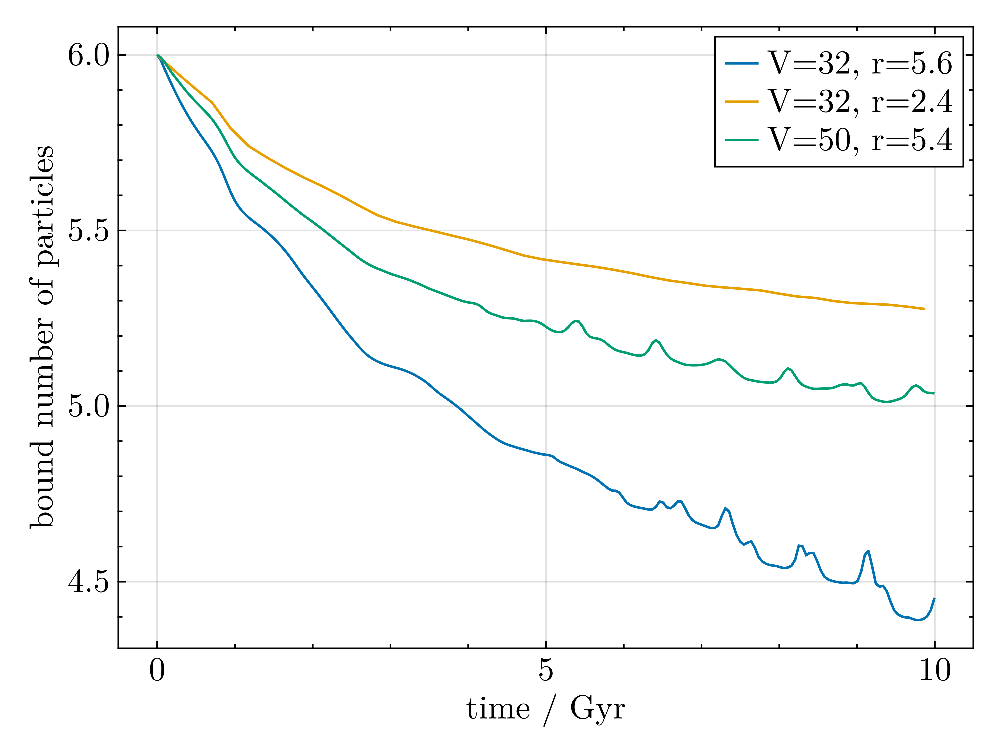

In [20]:
let
	fig, ax = FigAxis(
		xlabel="time / Gyr",
		ylabel = "bound number of particles",
	)

	for i in eachindex(profiles)
		
		vs = [p.N_bound for p in profiles[i].profiles]
		lines!(profiles[i].times * T2GYR, log10.(vs), label=labels[i])
	end

	axislegend()
	
	fig
end

In [ ]:
let
	fig, ax = FigAxis(
		xlabel=L"$\log\,r_\textrm{circ max}$ / kpc",
		ylabel = L"$\log\,v_\textrm{circ, max}$ / kpc",
	)

	for i in eachindex(profiles)
		profile = profiles[i]
		vs = [p.v_circ_max for p in profile.profiles]

		rs = [p.r_circ_max for p in profile.profiles]
		lines!(log10.(rs), log10.(vs * V2KMS), label=labels[i])
	end

	r = LinRange(1, 10, 100)
	v = 2π * r ./ (t_max_host /2)

	lines!(log10.(r), log10.(v * V2KMS), label=L"t=t_\textrm{max, host}/2", 
		color=:black, linestyle=:dot)

	axislegend(position=:rb)
	
	fig
end

In [ ]:
function t_max_of(prof)
	return 2π * prof.r_circ_max / prof.v_circ_max
end

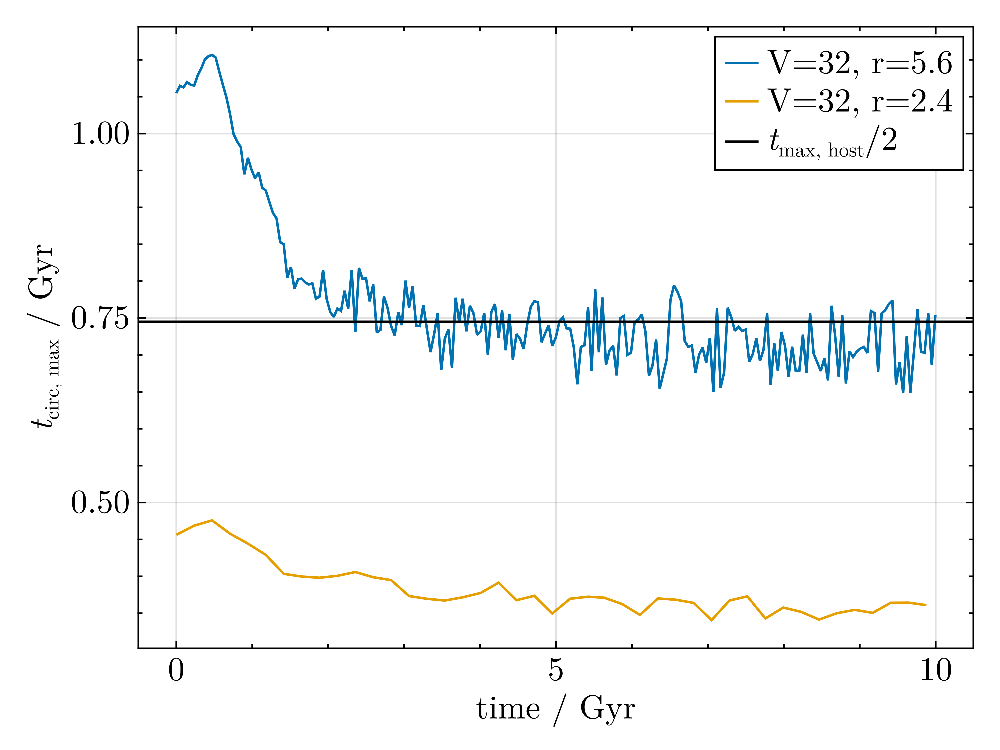

In [15]:
let
	fig, ax = FigAxis(
		xlabel="time / Gyr",
		ylabel = L"$t_\textrm{circ, max}$ / Gyr"
	)


	for i in eachindex(profiles)
		
		ts = t_max_of.(profiles[i].profiles)
		lines!(profiles[i].times * T2GYR, ts * T2GYR, label=labels[i])
	end

	hlines!(t_max_host * T2GYR / 2, color=:black, label=L"t_\textrm{max, host}/2")

	axislegend()
	fig
end

# Isolation

## Particle number

In [120]:
model_names = ["isolation/"] .* [
    "1e4/fiducial",
    "1e5/fiducial",
    "1e6_zeno2",
    #"1e7"
    ]
labels = [
    "1e4",
    "1e5",
    "1e6",
    "1e7"
    ]

profiles = load_profile.(model_names);

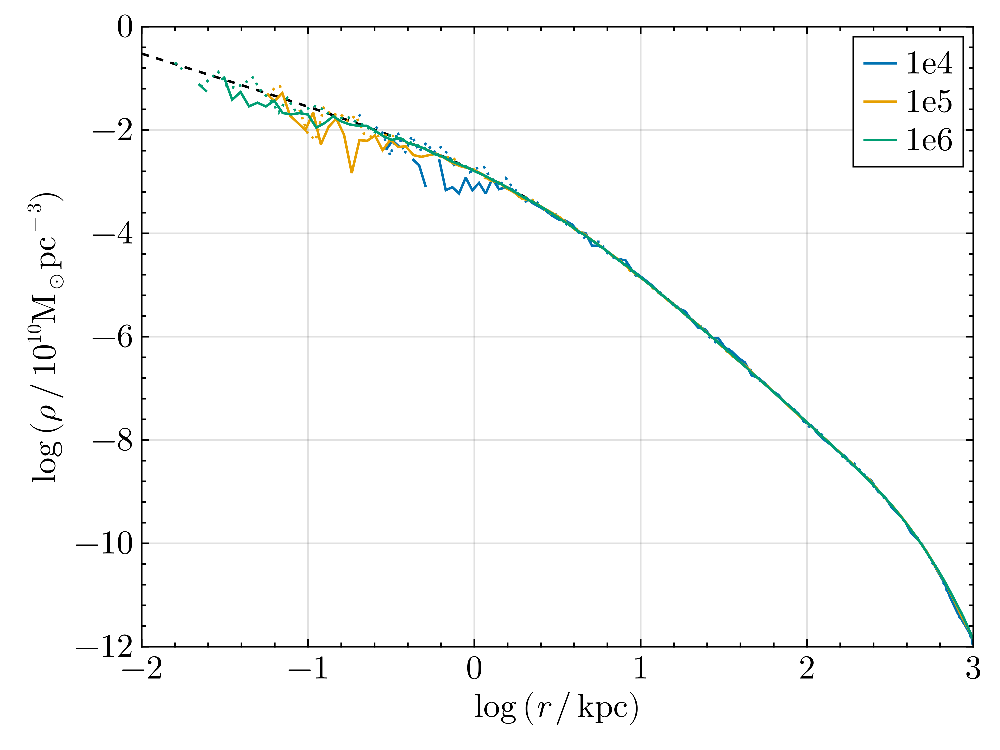

In [121]:
compare_densities(profiles, labels)

## 1e4

In [129]:
@printf "%-12s\t%-8s\t%-5s\n" "model" "cpu" "%grav"
println("-"^12, "\t", "-"^8, "\t", "-"^8)

for folder in readdir(joinpath(models_dir, "isolation/1e4"))

    try
        cpu, tree = cpu_summary("isolation/1e4/" * folder)
        @printf "%-12s\t%8.2f\t%4.1f" folder cpu tree
        println()
    catch e
    end
end

model       	cpu     	%grav
------------	--------	--------
acc_0.001   	   69.85	97.8
acc_0.003   	   69.53	97.8
acc_0.1     	   68.44	97.5
default     	   65.73	97.0
dt_0.01     	 4439.72	98.2
dt_0.03     	 1107.16	98.1
dt_0.1      	  273.86	98.0
dt_0.3      	  139.34	97.8
dt_1        	   36.12	96.7
dt_10       	    5.19	94.5
dt_3        	   17.77	96.7
fiducial    	 2268.18	97.9
fmm         	   89.85	97.9
s0.014      	  121.79	94.8
s0.44       	   69.66	97.3
s4          	   68.89	97.8
theta_0.01  	  339.08	99.4
theta_0.1   	  279.77	99.3
theta_1     	   23.21	92.8
thetarel_0.5	   31.48	94.4
treepm      	 1348.01	99.8


In [130]:
model_names = ["isolation/"] .* [
    "1e4/s0.014",
    "1e4/s0.44",
    "1e4/default",
    "1e4/s4"
    ]

labels = [
    "0.014",
    "0.44",
    "1.4",
    "4"
    ]

profiles = load_profile.(model_names);

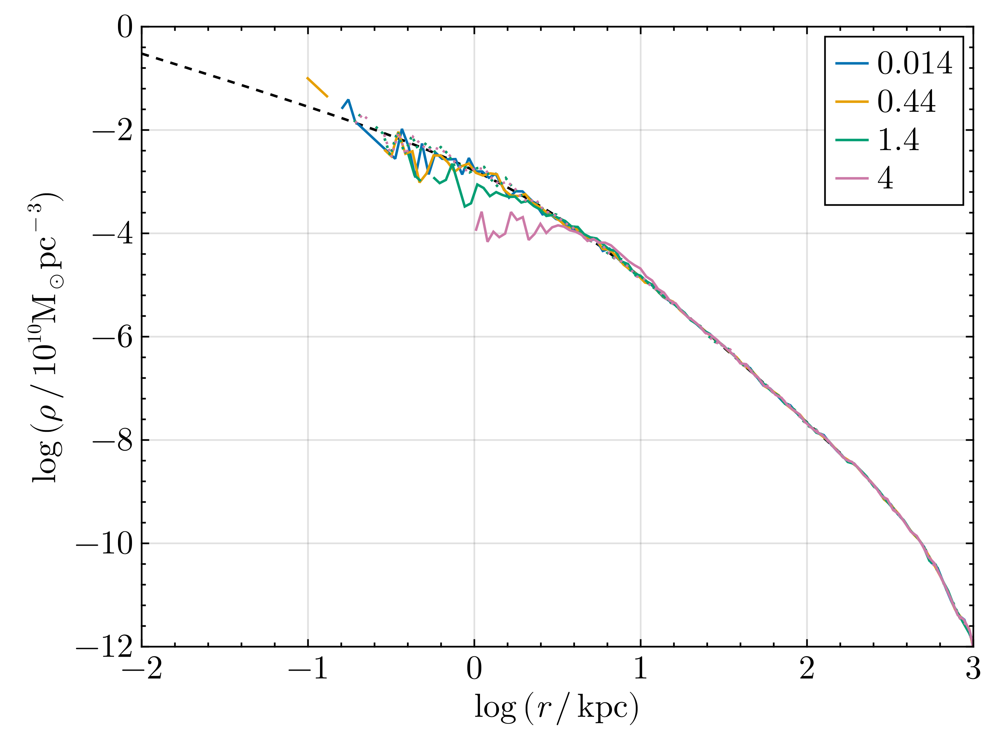

In [131]:
compare_densities(profiles, labels)

In [132]:
model_names = ["isolation/"] .* [
    "1e4/dt_0.01",
    "1e4/dt_1",
    "1e4/dt_10",
    "1e4/default",
    ]

labels = model_names
profiles = load_profile.(model_names);

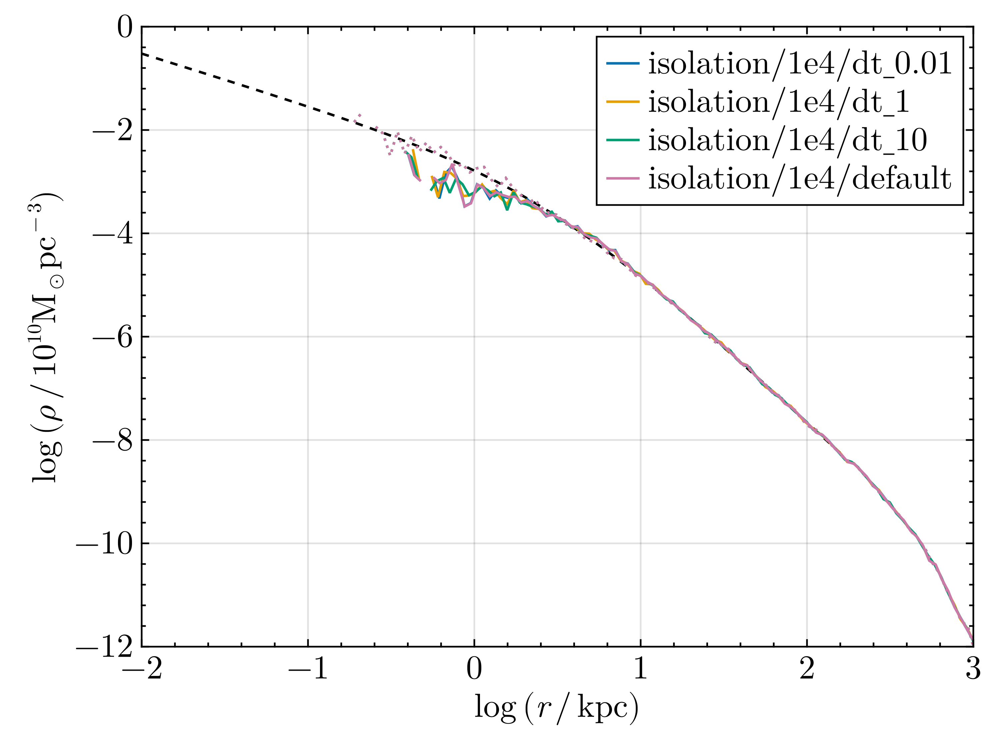

In [133]:
compare_densities(profiles, labels)

In [140]:
model_names = ["isolation/"] .* [
    "1e4/dt_0.01",
    "1e4/acc_0.001",
    "1e4/acc_0.003",
    "1e4/default",
    "1e4/acc_0.1",
    ]

labels = model_names
profiles = load_profile.(model_names);

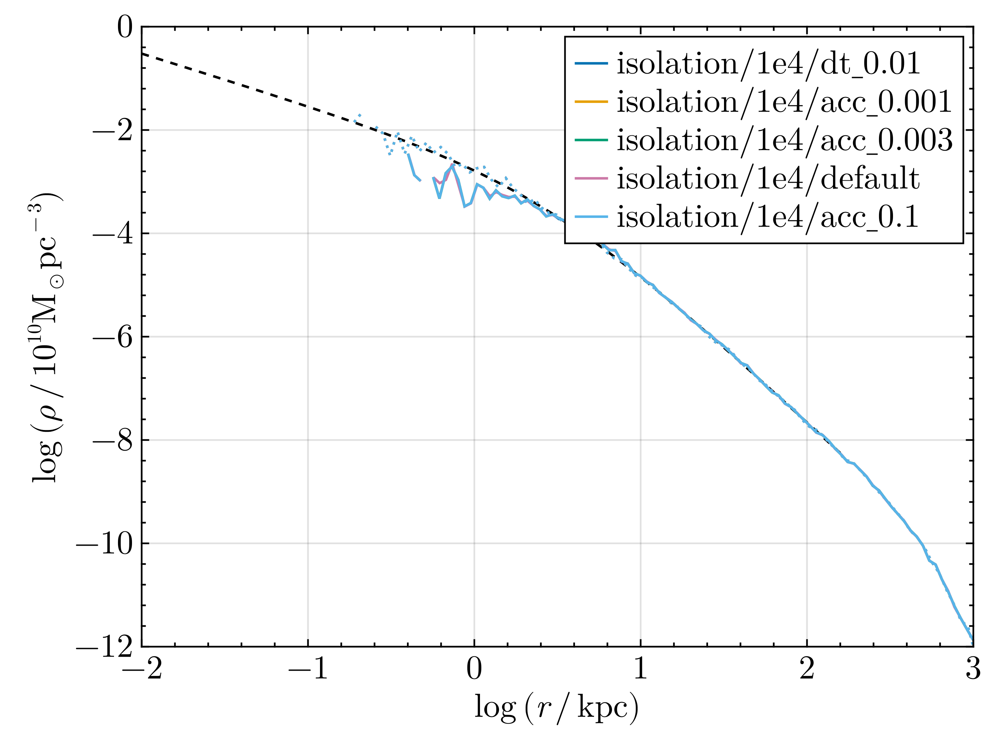

In [141]:
compare_densities(profiles, labels)

The above figure compares models using different relative timestepping criteria. The models perfectly converge around a parameter eta=0.003

### Gravitational force accuracy

In [142]:
model_names = ["isolation/"] .* [
    "1e4/theta_0.1",
    "1e4/default",
    "1e4/theta_1",
    ]

labels = model_names
profiles = load_profile.(model_names);

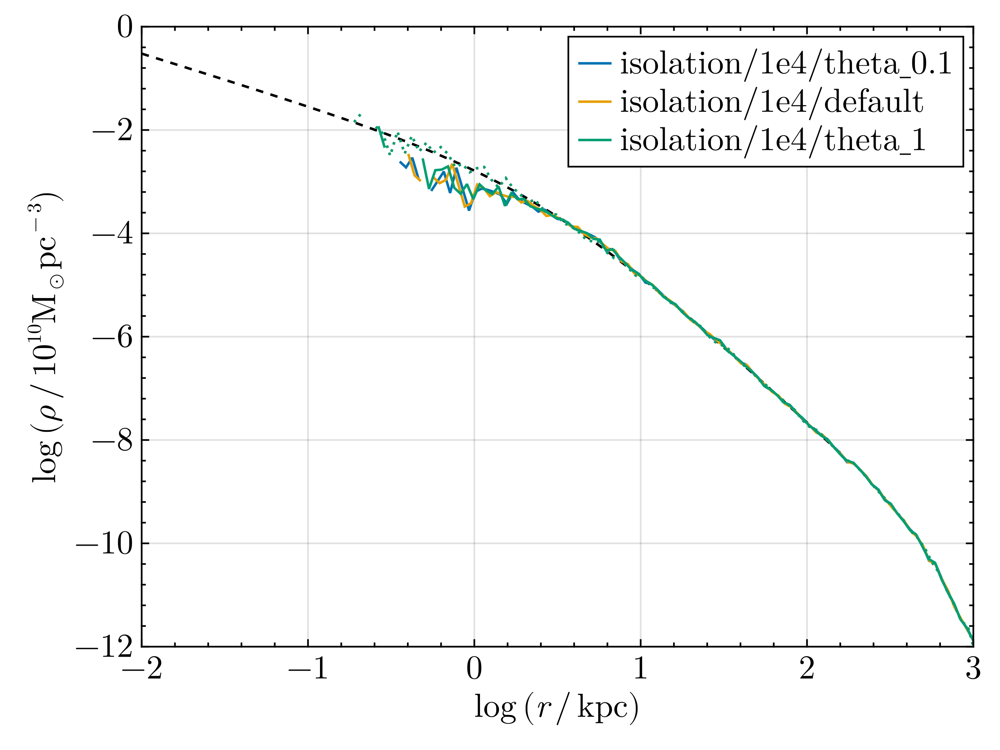

In [143]:
compare_densities(profiles, labels)

In [145]:
model_names = ["isolation/"] .* [
    "1e4/theta_0.01",
    "1e4/theta_0.1",
    "1e4/default",
    "1e4/thetarel_0.5",
    ]

labels = model_names
profiles = load_profile.(model_names);

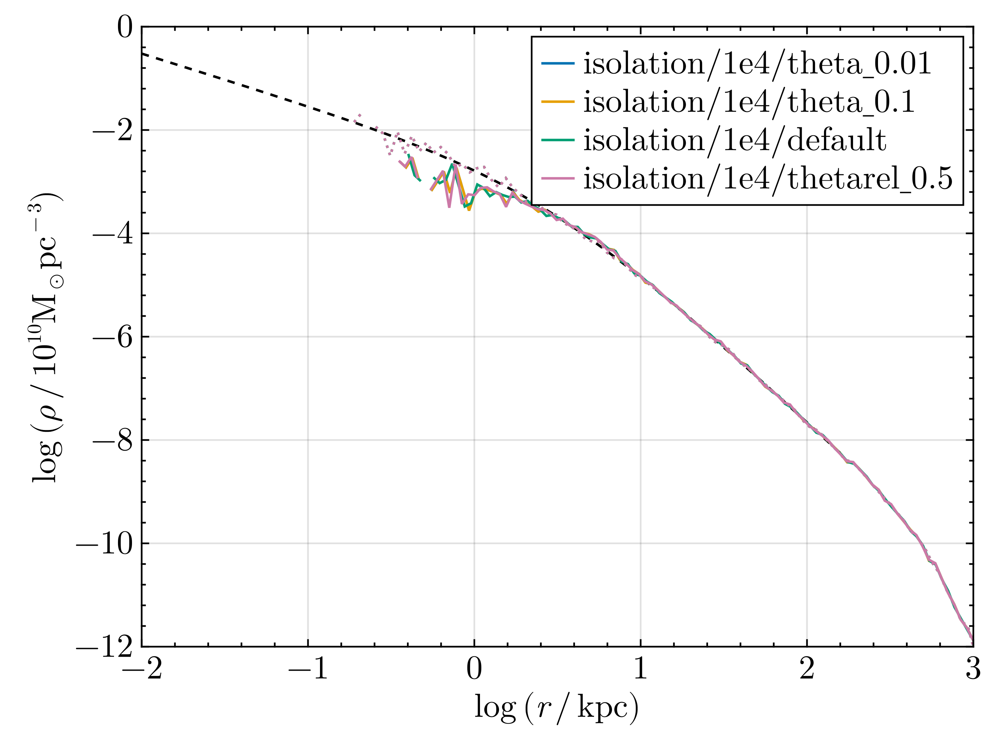

In [146]:
compare_densities(profiles, labels)

The models above compare different values of the gravitational opening criterion. Below a theta of 0.1, the models are perfectly converged here. 

### Gravity methods

In [147]:
model_names = ["isolation/1e4/"] .* [
    "dt_0.3",
    "treepm",
    "fmm",
    ]

labels = model_names
profiles = load_profile.(model_names);

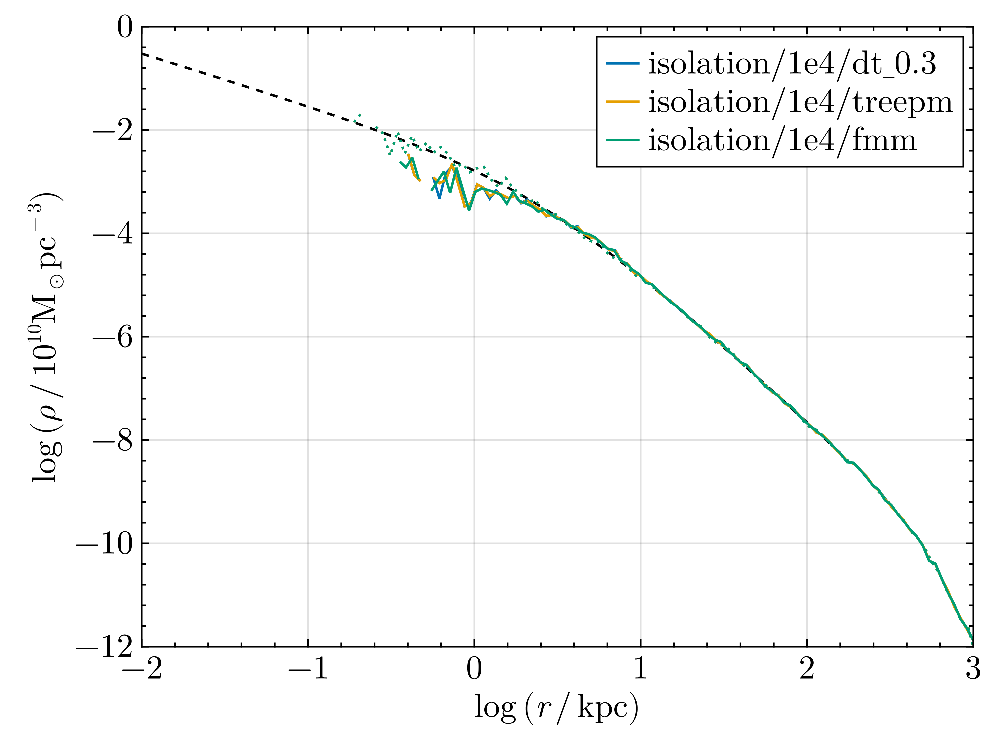

In [148]:
compare_densities(profiles, labels)

## 1e5

In [62]:
@printf "%-12s\t%-8s\t%-5s\n" "model" "cpu" "%grav"
println("-"^12, "\t", "-"^8, "\t", "-"^8)

for folder in readdir(joinpath(models_dir, "isolation/1e5"))

    try
        cpu, tree = cpu_summary("isolation/1e5/" * folder)
        @printf "%-12s\t%8.2f\t%4.1f" folder cpu tree
        println()
    catch e
    end
end

model       	cpu     	%grav
------------	--------	--------
default     	  370.69	96.1
facc_0.001  	  612.25	97.4
facc_0.015  	  318.20	95.3
fiducial    	 5973.05	95.9
s0.014      	  645.66	91.3
s0.044      	  447.10	93.5
s0.44       	  380.48	95.9
s1.4        	  394.29	96.1


In [55]:
model_names = ["isolation/1e5/"] .* [
    "s1.4",
    "s0.44",
    "default",
   #"fiducial",
    "s0.044",
    "s0.014",
    ]

labels = model_names
profiles = load_profile.(model_names);

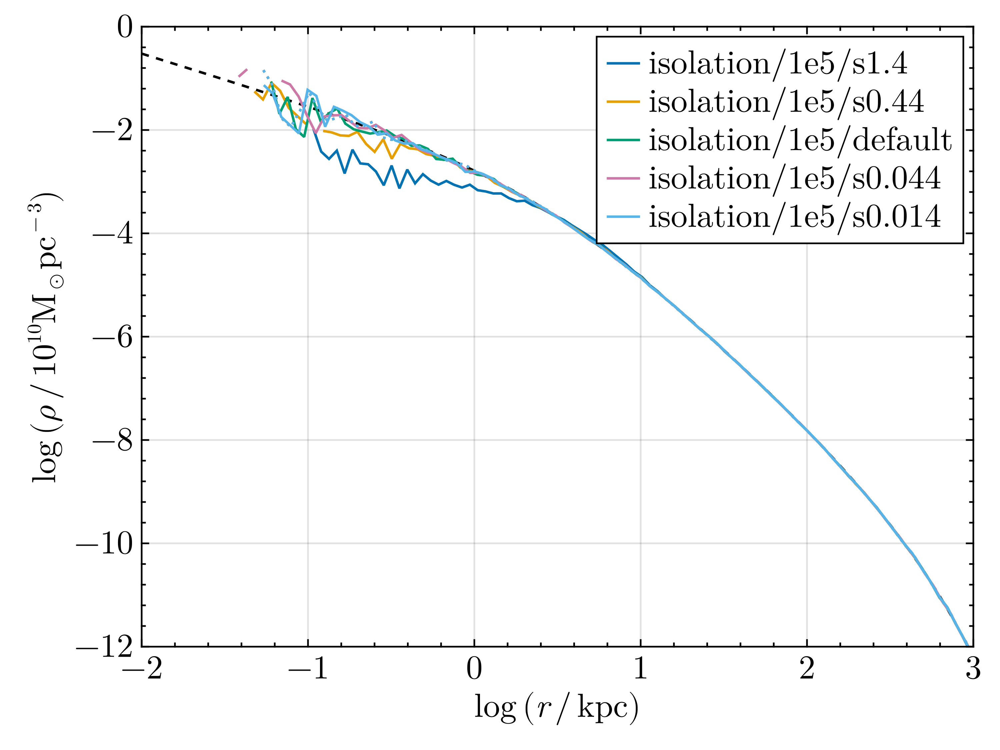

In [56]:
compare_densities(profiles, labels)

In [60]:
model_names = ["isolation/1e5/"] .* [
    "facc_0.015",
    "default",
   #"fiducial",
    "facc_0.001",
    ]

labels = model_names
profiles = load_profile.(model_names);

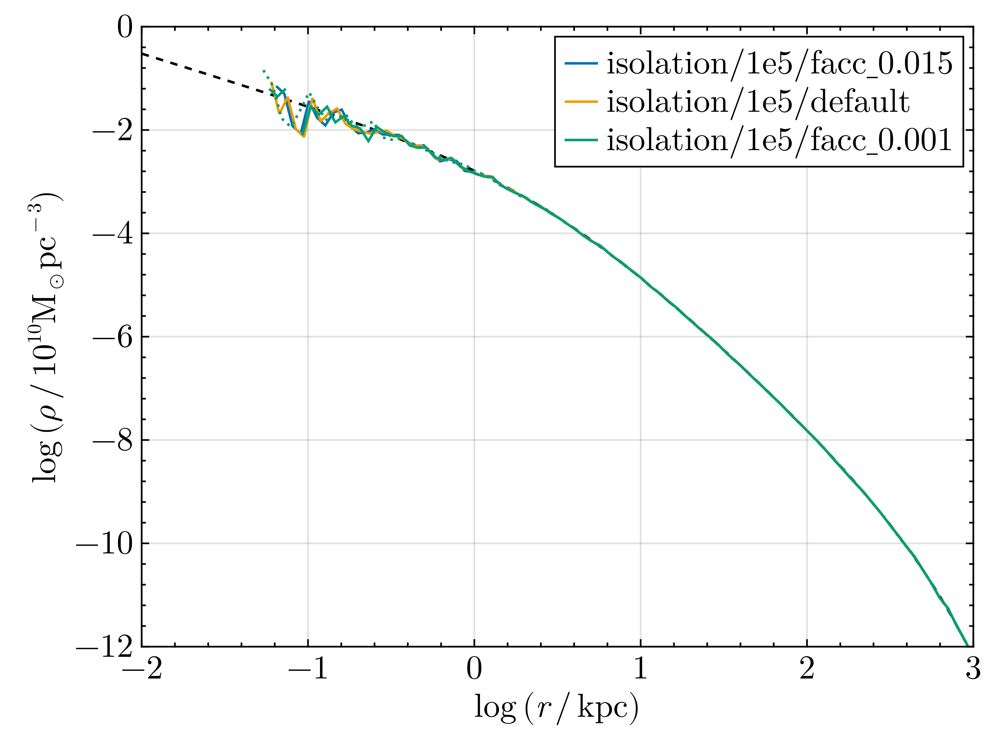

In [61]:
compare_densities(profiles, labels)

## 1e6

In [63]:
model_names = ["isolation/"] .* [
    "1e6_s0.0014",
    "1e6_s0.014",
    "1e6",
    "1e6_s1.4"
    ]

4-element Vector{String}:
 "isolation/1e6_s0.0014"
 "isolation/1e6_s0.014"
 "isolation/1e6"
 "isolation/1e6_s1.4"

In [64]:
profiles = load_profile.(model_names);

LoadError: KeyError: key "times" not found

In [6]:
labels = [
    "0.0014",
    "0.014",
    "0.14",
    "1.4"
    ]

4-element Vector{String}:
 "0.0014"
 "0.014"
 "0.14"
 "1.4"

In [7]:
fig = Figure()
ax = LP.rho_axis(fig[1, 1])
ax.limits=(-2, 2.2, -10, 0)

pi = 1

for i in eachindex(profiles)
    
    profile = profiles[i][1]
    lines!(profile.log_r, log10.(profile.rho),
        linestyle=:dot,
        color=COLORS[i]
    )

    profile = profiles[i][end]
    lines!(profile.log_r, log10.(profile.rho), 
        color=COLORS[i],
        label=labels[i]
    )

    h = parse(Float64, labels[i])

    arrows!([log10(h)], [-5], [0], [0.5], color=COLORS[i])
end


axislegend(
    "softening / kpc"
)
fig

LoadError: UndefVarError: `profiles` not defined

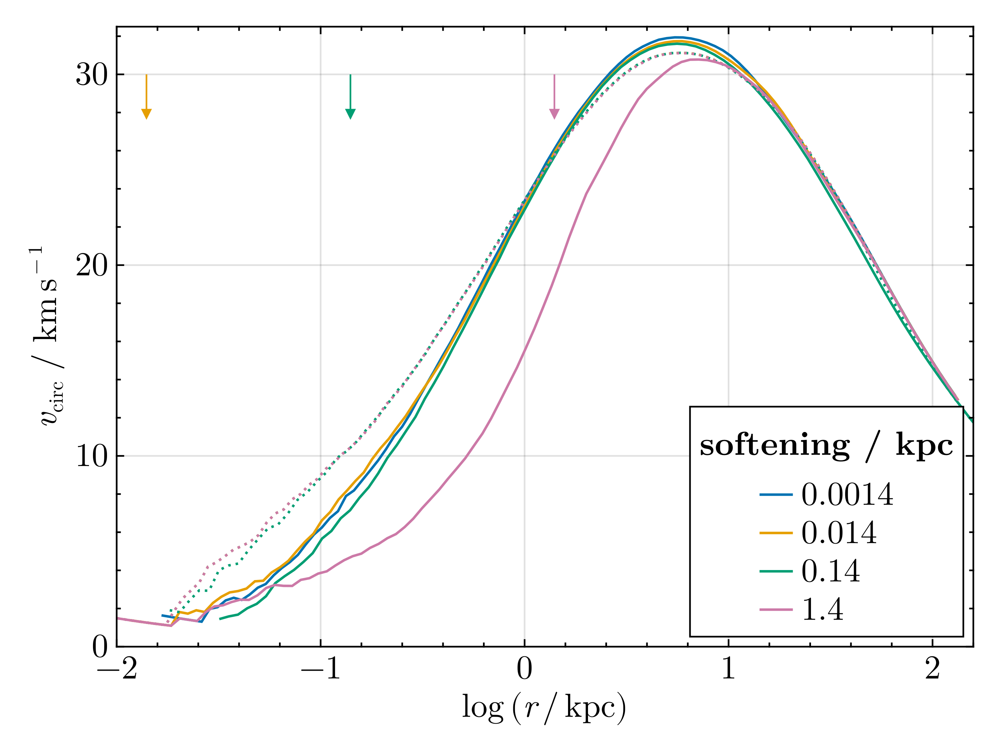

In [17]:
fig = Figure()
ax = Axis(fig[1, 1],
    xlabel=LP.log_r_label,
    ylabel=L"$v_\textrm{circ}$ / km\,s$^{-1}$",
    limits=(-2, 2.2, 0, 32.5),
    )
pi = 1

for i in eachindex(profiles)
    
    profile = profiles[i][1]
    lines!(profile.log_r, (profile.v_circ * V2KMS),
        linestyle=:dot,
        color=COLORS[i]
    )

    profile = profiles[i][end]
    lines!(profile.log_r, (profile.v_circ* V2KMS), 
        color=COLORS[i],
        label=labels[i]
    )

    h = parse(Float64, labels[i])
    arrows!([log10(h)], [30], [0], [-2], color=COLORS[i])

end


axislegend(
    "softening / kpc",
    position=:rb
)
fig

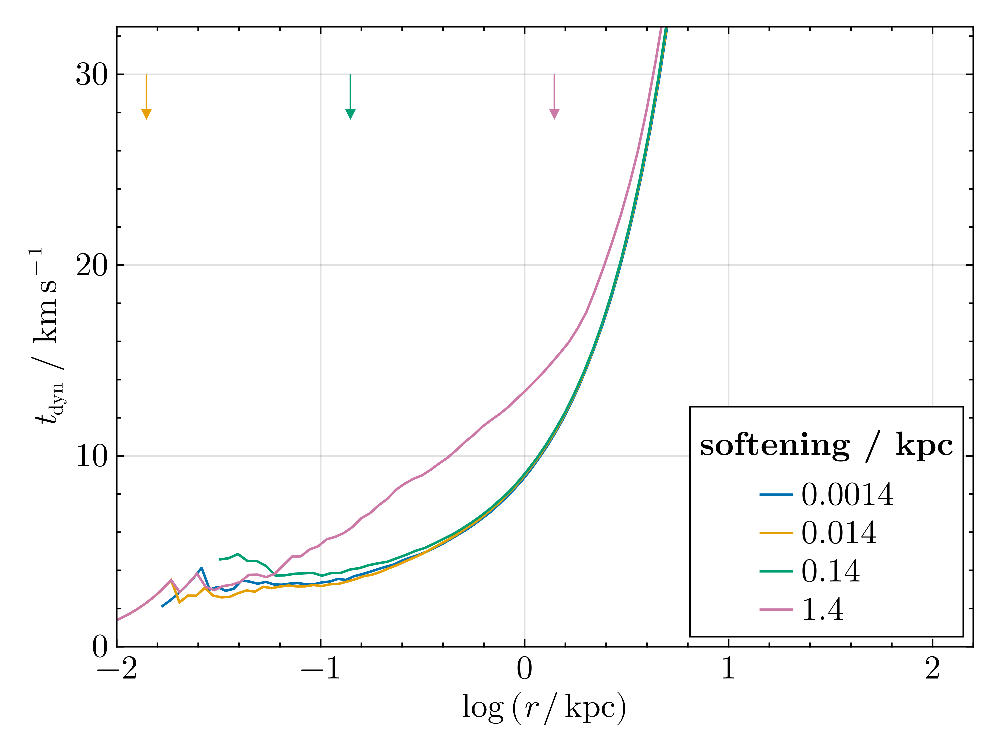

In [18]:
fig = Figure()
ax = Axis(fig[1, 1],
    xlabel=LP.log_r_label,
    ylabel=L"$t_\textrm{dyn}$ / km\,s$^{-1}$",
    limits=(-2, 2.2, 0, 32.5),
    )
pi = 1

for i in eachindex(profiles)
    
    profile = profiles[i][1]

    profile = profiles[i][end]
    lines!(profile.log_r, 10 .^ profile.log_r ./ (profile.v_circ), 
        color=COLORS[i],
        label=labels[i]
    )

    h = parse(Float64, labels[i])
    arrows!([log10(h)], [30], [0], [-2], color=COLORS[i])

end


axislegend(
    "softening / kpc",
    position=:rb
)
fig

## Halo generation methods

In [96]:
model_names = ["isolation/"] .* [
    "1e6",
    "1e6_agama",
    "1e6_zeno2",
    ]

3-element Vector{String}:
 "isolation/1e6"
 "isolation/1e6_agama"
 "isolation/1e6_zeno2"

In [97]:
profiles = load_profile.(model_names);

In [98]:
labels = [
    "gspmodel",
    "agama",
    "gsprealize",
    ]

3-element Vector{String}:
 "gspmodel"
 "agama"
 "gsprealize"

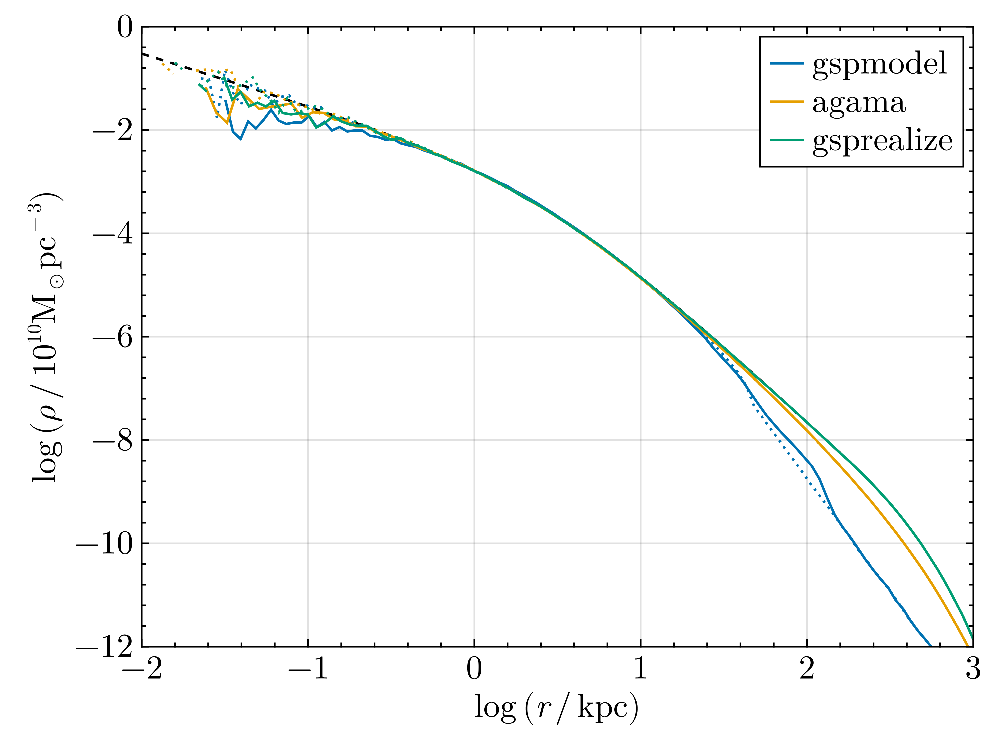

In [100]:
compare_densities(profiles, labels)

# 1e7

In [10]:
model_dir = "/astro/dboyea/sculptor/isolation/1e7/out/"
profiles_c = LilGuys.Profiles3D("$model_dir/profiles.hdf5")
profiles_z = LilGuys.Profiles3D("$model_dir/profiles_z.hdf5");

In [13]:
profiles = [
    profiles_c,
    profiles_z,
    ];

In [15]:
labels = ["centred", "uncentred"]

2-element Vector{String}:
 "centred"
 "uncentred"

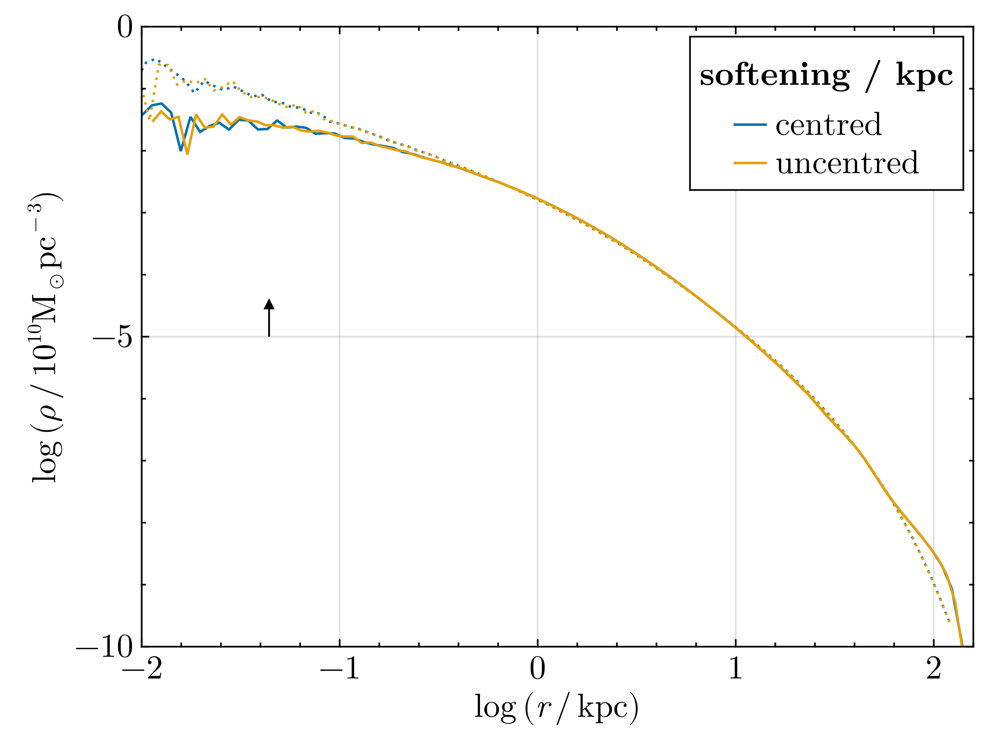

In [17]:
fig = Figure()
ax = LP.rho_axis(fig[1, 1])
ax.limits=(-2, 2.2, -10, 0)

pi = 1

for i in eachindex(profiles)
    
    profile = profiles[i][1]
    lines!(profile.log_r, log10.(profile.rho),
        linestyle=:dot,
        color=COLORS[i]
    )

    profile = profiles[i][end]
    lines!(profile.log_r, log10.(profile.rho), 
        color=COLORS[i],
        label=labels[i]
    )

    h = 0.044

    arrows!([log10(h)], [-5], [0], [0.5], color=:black)
end


axislegend(
    "softening / kpc"
)
fig